# Experimenting with different PyMC sampling backends

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
from time import time

import arviz as az
import janitor  # noqa: F401
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotnine as gg
import pymc as pm
import pymc.sampling_jax
import seaborn as sns

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/aesara/link/jax/dispatch.py:87: UserWarning: JAX omnistaging couldn't be disabled: Disabling of omnistaging is no longer supported in JAX version 0.2.12 and higher: see https://github.com/google/jax/blob/main/design_notes/omnistaging.md.
/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/pymc/sampling_jax.py:36: UserWarning: This module is experimental.


In [35]:
from speclet.bayesian_models.hierarchical_nb import HierarchcalNegativeBinomialModel
from speclet.io import DataFile
from speclet.managers.data_managers import CrisprScreenDataManager
from speclet.plot.plotnine_helpers import set_gg_theme
from speclet.project_enums import ModelFitMethod

In [4]:
# Notebook execution timer.
notebook_tic = time()

# Plotting setup.
%config InlineBackend.figure_format = "retina"
set_gg_theme()

# Constants
RANDOM_SEED = 847

## Mock data and simple model

### Data generation

In [5]:
np.random.seed(RANDOM_SEED)

N = 30000
b = np.random.normal(loc=[10.2, 1, -3, 2], scale=[1, 1, 1, 1], size=(N, 4))
x1 = np.random.uniform(-2, 2, N)
x2 = np.random.uniform(-2, 2, N)
err = np.random.normal(0, 1, N)
err = 0
y = b[:, 0] + (b[:, 1] * x1) - (b[:, 2] * x2) + (b[:, 3] * x1**2) + err
data = pd.DataFrame({"x1": x1, "x2": x2, "y": y})
data.head()

,x1,x2,y
0,0.860896,1.913594,20.134452
1,1.926901,1.900653,27.721610
2,-0.846302,0.311208,10.907071
3,-1.973597,0.105062,21.574877
4,-0.907437,0.963983,16.353752


/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/plotnine/utils.py:371: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.


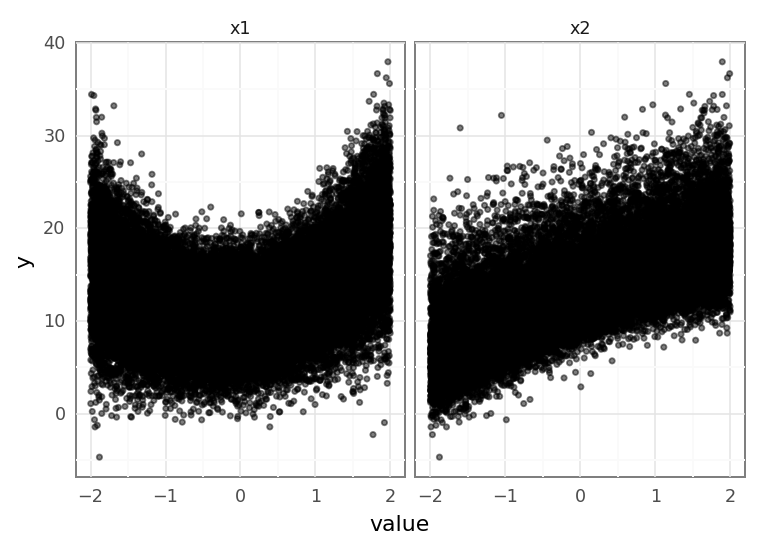

<ggplot: (347402298)>

In [6]:
(
    gg.ggplot(data.pivot_longer(index=["y"]), gg.aes(x="value", y="y"))
    + gg.facet_wrap("~variable", nrow=1)
    + gg.geom_point(alpha=0.5, size=1)
    + gg.theme(figure_size=(7, 3))
)

### Model design

In [7]:
def build_model(data: pd.DataFrame) -> pm.Model:
    x1 = data.x1.values
    x2 = data.x2.values
    y = data.y.values
    with pm.Model(rng_seeder=RANDOM_SEED * 2) as model:
        b = pm.Normal("beta", 0, 10, shape=(4))
        mu = pm.Deterministic("mu", b[0] + (x1 * b[1]) + (x2 * b[2]) + (x1**2 * b[3]))
        sigma = pm.HalfNormal("sigma", 5)
        y = pm.Normal("y", mu, sigma, observed=y)
    return model

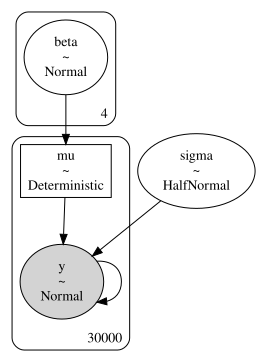

In [8]:
pm.model_to_graphviz(build_model(data))

### Sampling

#### Default

In [9]:
with build_model(data) as model:
    trace_std = pm.sample(chains=4, cores=4)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/pymc/aesaraf.py:996: UserWarning: The parameter 'updates' of aesara.function() expects an OrderedDict, got <class 'dict'>. Using a standard dictionary here results in non-deterministic behavior. You should use an OrderedDict if you are using Python 2.7 (collections.OrderedDict for older python), or use a list of (shared, update) pairs. Do not just convert your dictionary to this type before the call as the conversion will still be non-deterministic.
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [beta, sigma]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 46 seconds.


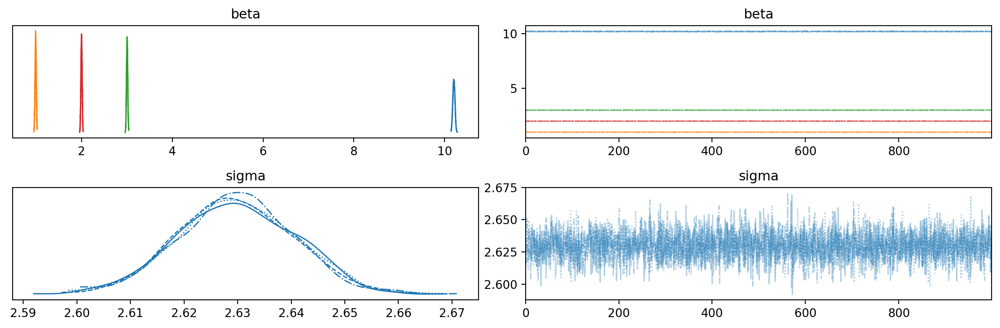

In [10]:
az.plot_trace(trace_std, var_names=["beta", "sigma"])
plt.tight_layout();

#### Numpyro

In [11]:
with build_model(data) as model:
    trace_numpyro = pm.sampling_jax.sample_numpyro_nuts(chains=4)

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/pymc/aesaraf.py:996: UserWarning: The parameter 'updates' of aesara.function() expects an OrderedDict, got <class 'dict'>. Using a standard dictionary here results in non-deterministic behavior. You should use an OrderedDict if you are using Python 2.7 (collections.OrderedDict for older python), or use a list of (shared, update) pairs. Do not just convert your dictionary to this type before the call as the conversion will still be non-deterministic.


Compiling...
Compilation time =  0:00:01.431740
Sampling...


Compiling.. :   0%|                                                                                          | 0/2000 [00:00<?, ?it/s]

  0%|                                                                                                        | 0/2000 [00:00<?, ?it/s]

Compiling.. :   0%|                                                                                          | 0/2000 [00:00<?, ?it/s]


  0%|                                                                                                        | 0/2000 [00:00<?, ?it/s]


Running chain 1:   0%|                                                                                       | 0/2000 [00:05<?, ?it/s]

Running chain 2:   0%|                                                                                       | 0/2000 [00:05<?, ?it/s]


Running chain 3:   0%|                                                                                       | 0/2000 [00:05<?, ?it/s]


Running chain 3:   5%|███▊                  

Sampling time =  0:00:18.320438
Transforming variables...
Transformation time =  0:01:03.275481


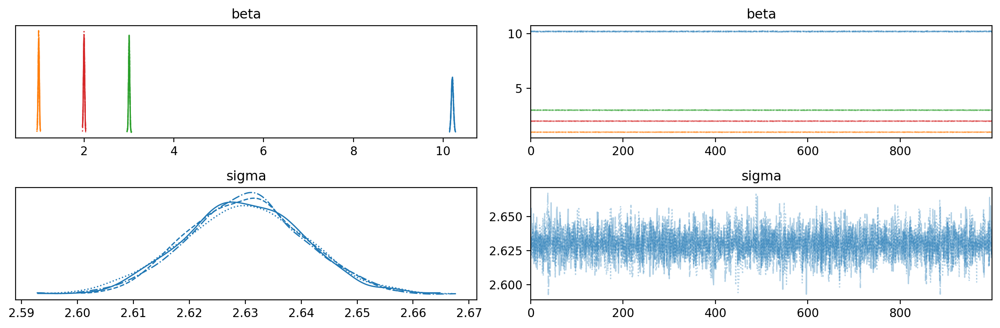

In [12]:
az.plot_trace(trace_numpyro, var_names=["beta", "sigma"])
plt.tight_layout();

### Comparing posteriors

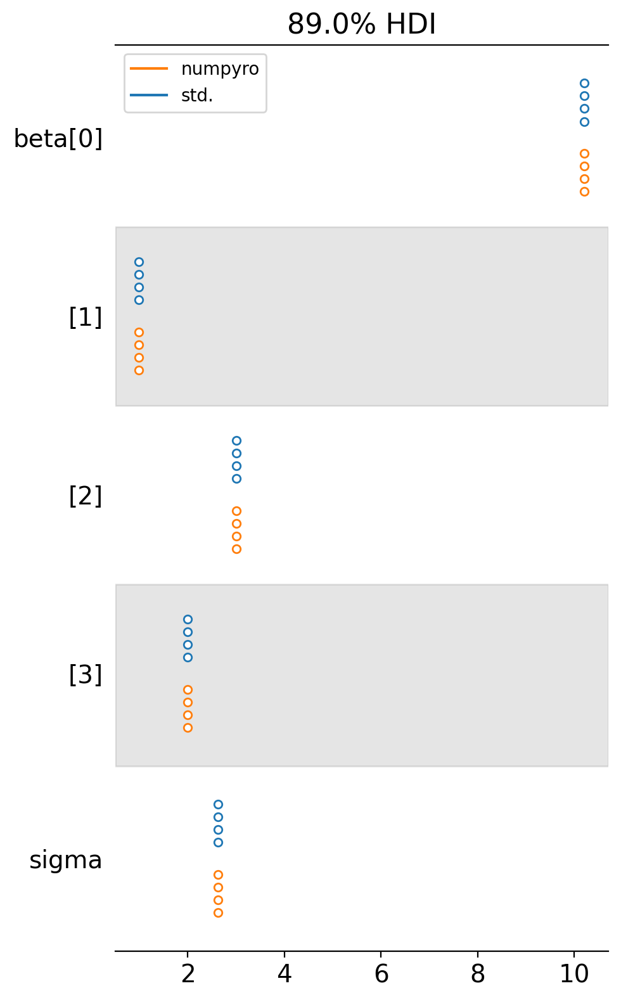

In [13]:
az.plot_forest(
    [trace_std, trace_numpyro],
    model_names=["std.", "numpyro"],
    var_names=["beta", "sigma"],
    hdi_prob=0.89,
    figsize=(5, 8),
)
plt.tight_layout();

## Hierarchical model

### Data and model preparation

In [14]:
crispr_data = CrisprScreenDataManager(DataFile.DEPMAP_CRC_BONE_SUBSAMPLE).get_data()
crispr_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,lineage_subtype,primary_or_metastasis,is_male,age
0,CGGAGCCTCGCCATTCCCGA,COLO201-311Cas9_RepA_p6_batch3,-0.183298,3,chr9_136410332_-,ENTR1,broad,True,9,136410332,...,NaN,NaN,NaN,False,1.064776,colorectal,colorectal_adenocarcinoma,metastasis,True,70.0
1,AAATAATTAAGTATGCACAT,COLO201-311Cas9_RepA_p6_batch3,-1.102995,3,chr13_48081696_-,MED4,broad,True,13,48081696,...,NaN,NaN,NaN,False,1.582238,colorectal,colorectal_adenocarcinoma,metastasis,True,70.0
2,AACAGCTGTTTACCAAGCGA,COLO201-311Cas9_RepA_p6_batch3,-0.991020,3,chr13_48083409_-,MED4,broad,True,13,48083409,...,NaN,NaN,NaN,False,1.582238,colorectal,colorectal_adenocarcinoma,metastasis,True,70.0
3,AATCAACCCACAGCTGCACA,COLO201-311Cas9_RepA_p6_batch3,0.219207,3,chr17_7675183_+,TP53,broad,True,17,7675183,...,NaN,NaN,NaN,False,0.978003,colorectal,colorectal_adenocarcinoma,metastasis,True,70.0
4,ACAAGGGGCGACCGTCGCCA,COLO201-311Cas9_RepA_p6_batch3,0.003980,3,chr8_103415011_-,DCAF13,broad,True,8,103415011,...,NaN,NaN,NaN,False,1.234548,colorectal,colorectal_adenocarcinoma,metastasis,True,70.0


In [15]:
for c in ["sgrna", "hugo_symbol", "depmap_id", "lineage"]:
    print(f"unique values in column '{c}': {crispr_data[c].nunique()}")

unique values in column 'sgrna': 338
unique values in column 'hugo_symbol': 113
unique values in column 'depmap_id': 10
unique values in column 'lineage': 2


In [16]:
crispr_data.shape

(2000, 25)

In [17]:
np.random.seed(RANDOM_SEED)
sample_genes = np.random.choice(
    crispr_data.hugo_symbol.unique(), size=20, replace=False
)
crispr_data = crispr_data.filter_column_isin("hugo_symbol", sample_genes)

In [18]:
crispr_data.shape

(336, 25)

In [19]:
for c in ["sgrna", "hugo_symbol", "depmap_id", "lineage"]:
    print(f"unique values in column '{c}': {crispr_data[c].nunique()}")

unique values in column 'sgrna': 60
unique values in column 'hugo_symbol': 20
unique values in column 'depmap_id': 10
unique values in column 'lineage': 2


In [20]:
hnb_model = HierarchcalNegativeBinomialModel()

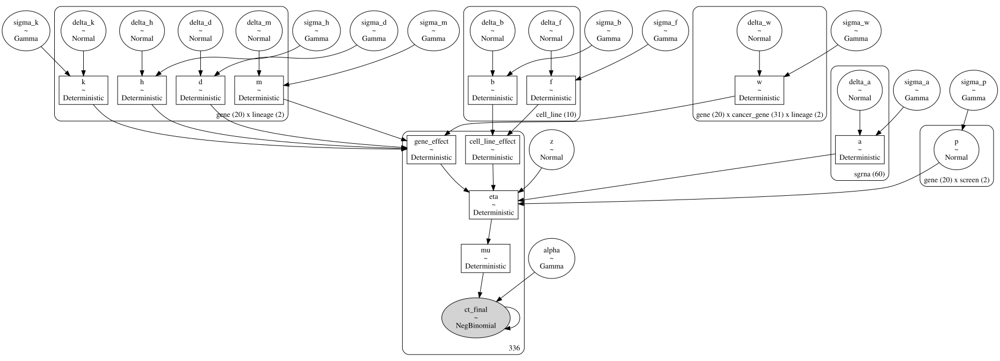

In [21]:
pm.model_to_graphviz(hnb_model.pymc_model(crispr_data))

### Sampling

In [22]:
sampling_kwargs = {
    "draws": 500,
    "tune": 500,
    "chains": 2,
    "target_accept": 0.99,
}

In [23]:
def _plot_hnb_trace(trace: az.InferenceData) -> None:
    var_names = HierarchcalNegativeBinomialModel().vars_regex(ModelFitMethod.PYMC_MCMC)
    az.plot_trace(trace, var_names=var_names, filter_vars="regex")
    plt.tight_layout()
    plt.show()
    return None

#### Default

In [25]:
with hnb_model.pymc_model(crispr_data, seed=RANDOM_SEED) as m:
    crispr_trace_std = pm.sample(**sampling_kwargs)

Auto-assigning NUTS sampler...
INFO:pymc:Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
INFO:pymc:Initializing NUTS using jitter+adapt_diag...
/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/pymc/aesaraf.py:996: UserWarning: The parameter 'updates' of aesara.function() expects an OrderedDict, got <class 'dict'>. Using a standard dictionary here results in non-deterministic behavior. You should use an OrderedDict if you are using Python 2.7 (collections.OrderedDict for older python), or use a list of (shared, update) pairs. Do not just convert your dictionary to this type before the call as the conversion will still be non-deterministic.
Multiprocess sampling (2 chains in 2 jobs)
INFO:pymc:Multiprocess sampling (2 chains in 2 jobs)
NUTS: [z, sigma_a, delta_a, sigma_b, delta_b, sigma_d, delta_d, sigma_f, delta_f, sigma_h, delta_h, sigma_k, delta_k, sigma_m, delta_m, sigma_w, delta_w, sigma_p, p, alpha]
INFO:pymc:NUTS: [z, sigma_a,

Sampling 2 chains for 500 tune and 500 draw iterations (1_000 + 1_000 draws total) took 1131 seconds.
INFO:pymc:Sampling 2 chains for 500 tune and 500 draw iterations (1_000 + 1_000 draws total) took 1131 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics
INFO:pymc:We recommend running at least 4 chains for robust computation of convergence diagnostics


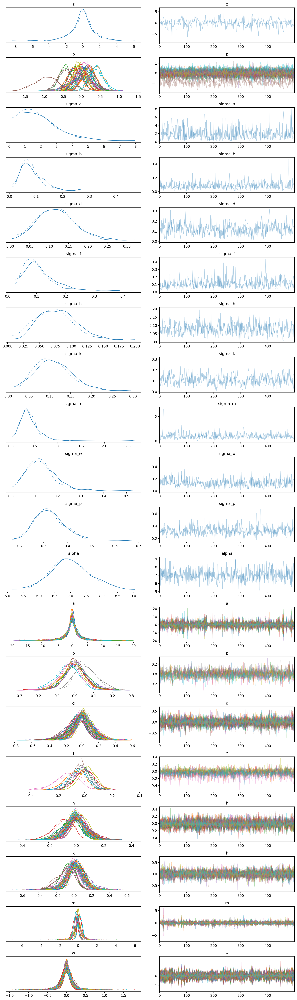

In [26]:
_plot_hnb_trace(crispr_trace_std);

#### Numpyro

In [27]:
with hnb_model.pymc_model(crispr_data, seed=RANDOM_SEED) as m:
    crispr_trace_npr = pm.sampling_jax.sample_numpyro_nuts(**sampling_kwargs)

Compiling...


/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.10/site-packages/pymc/aesaraf.py:996: UserWarning: The parameter 'updates' of aesara.function() expects an OrderedDict, got <class 'dict'>. Using a standard dictionary here results in non-deterministic behavior. You should use an OrderedDict if you are using Python 2.7 (collections.OrderedDict for older python), or use a list of (shared, update) pairs. Do not just convert your dictionary to this type before the call as the conversion will still be non-deterministic.


Compilation time =  0:00:06.320453
Sampling...


Running chain 1: 100%|████████████████████████████████████████████████████████████████████████████| 1000/1000 [02:13<00:00,  7.49it/s]


Sampling time =  0:02:15.400316
Transforming variables...
Transformation time =  0:00:02.639432


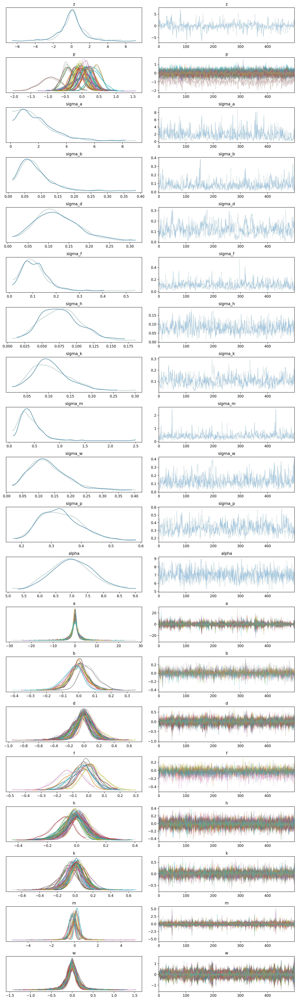

In [28]:
_plot_hnb_trace(crispr_trace_npr);

### Compare posteriors

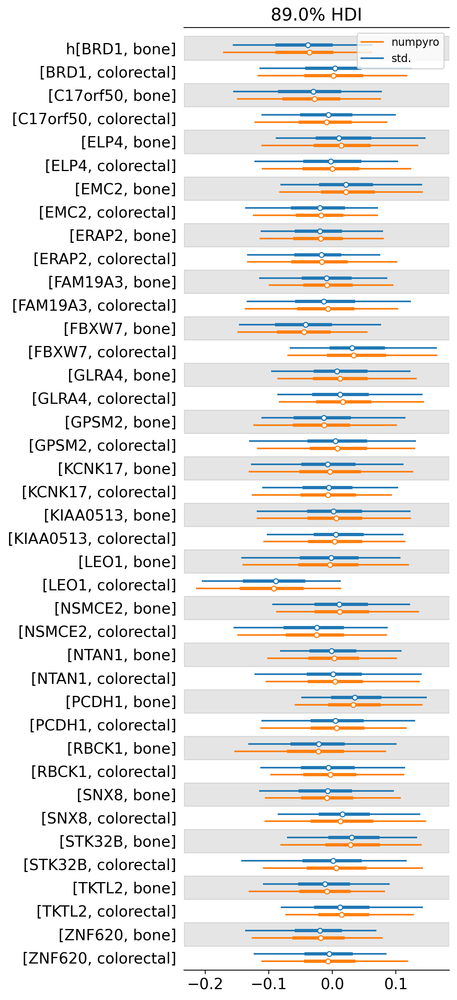

In [29]:
az.plot_forest(
    [crispr_trace_std, crispr_trace_npr],
    model_names=["std.", "numpyro"],
    var_names=["h"],
    hdi_prob=0.89,
    combined=True,
)
plt.tight_layout();

In [30]:
var_avg_diffs = np.array([], dtype=float)
var_sd_diffs = np.array([], dtype=float)

for v in crispr_trace_std.posterior:
    std_avgs = crispr_trace_std.posterior[v].values.mean(axis=0)
    npr_avgs = crispr_trace_npr.posterior[v].values.mean(axis=0)
    _avg_diffs = (std_avgs - npr_avgs).flatten()
    var_avg_diffs = np.concatenate([var_avg_diffs, _avg_diffs])

    std_sd = crispr_trace_std.posterior[v].values.std(axis=0)
    npr_sd = crispr_trace_npr.posterior[v].values.std(axis=0)
    _sd_diffs = (std_sd - npr_sd).flatten()
    var_sd_diffs = np.concatenate([var_sd_diffs, _sd_diffs])

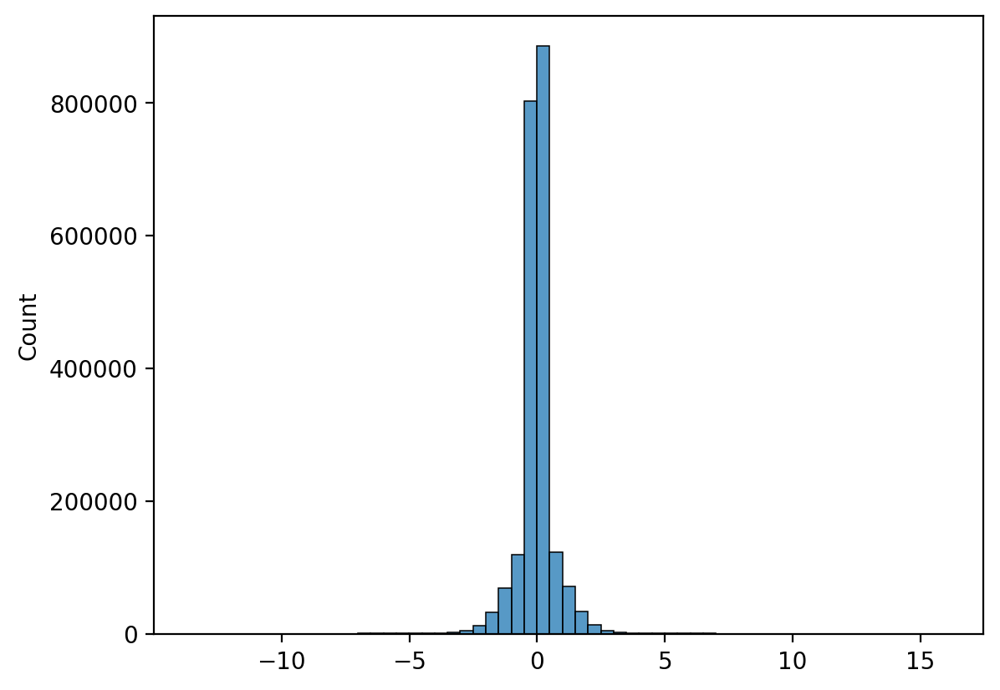

In [31]:
sns.histplot(var_avg_diffs, binwidth=0.5);

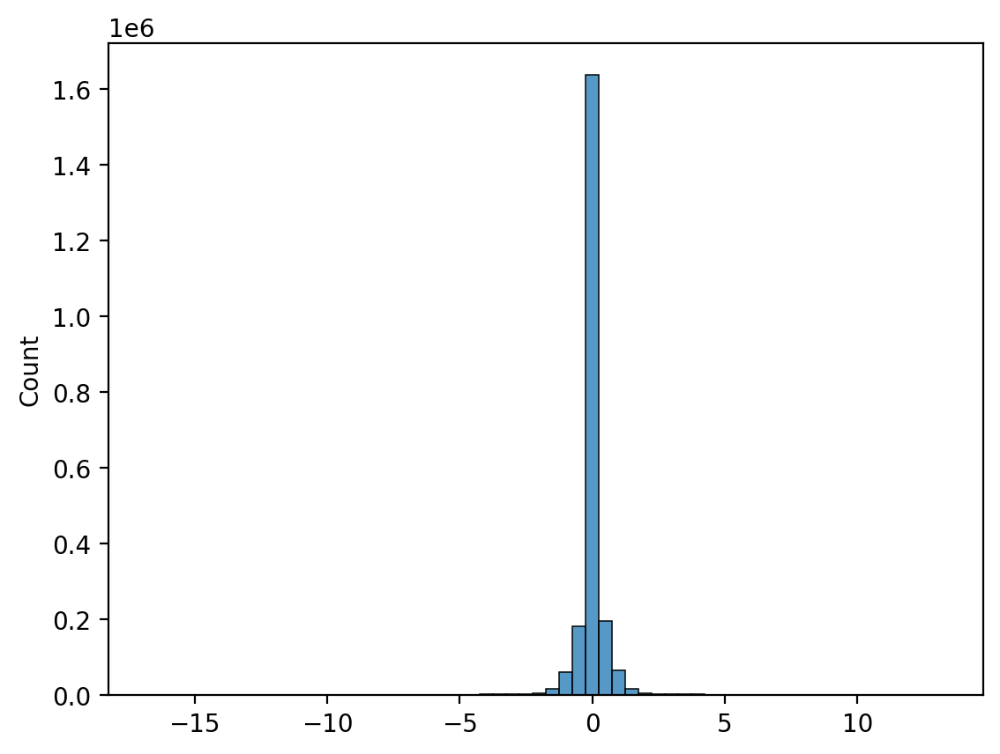

In [32]:
sns.histplot(var_sd_diffs, binwidth=0.5);

---

In [33]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 27.54 minutes


In [34]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-05-13

Python implementation: CPython
Python version       : 3.10.4
IPython version      : 8.3.0

Compiler    : Clang 12.0.1 
OS          : Darwin
Release     : 21.4.0
Machine     : x86_64
Processor   : i386
CPU cores   : 4
Architecture: 64bit

Hostname: JHCookMac

Git branch: pymc-backends

janitor   : 0.22.0
seaborn   : 0.11.2
pandas    : 1.4.2
plotnine  : 0.8.0
matplotlib: 3.5.2
arviz     : 0.12.0
numpy     : 1.22.3
pymc      : 4.0.0b5

